In [ ]:
# For Google Colab imports
!pip install librosa 

# Importing libraries/Dependencies

In [1]:
import librosa # Music and audio analysis.
import librosa.display # Data visualization
import seaborn as sns # Data visualization
import numpy as np # Data Wrangling 
import IPython # To display audio files
import os  # For file management
import pandas as pd  # To create/manipulate data frames
import matplotlib.pyplot as plt # Data visualization

# Use inline so our visualizations display in notebook.
%matplotlib inline 

In [ ]:
# Google Colab for attaching Google Drive data
from google.colab import drive
drive.mount('/content/drive')

```
Example 1 with Trump Original and Trump to Linus
```

In [2]:
# To present the real audio
real_audio_trump = "/content/Cut version/trump-original-cut-version.wav"
print("Real Audio Trump:")
IPython.display.Audio(real_audio_trump)


Real Audio Trump:


In [3]:
# To present the fake audio
fake_audio_trump_to_linus = "/content/Cut version/trump-to-linus-cut-version.wav"
print("Fake Audio Trump to Linus:")
IPython.display.Audio(fake_audio_trump_to_linus)

Fake Audio Trump to Linus:


```
Example 2 with Linus Original and Linus to Trump
```

In [4]:
# To present the real audio
real_audio_linus = "/content/Cut version/linus-original-cut-version.wav"
print("Real Audio Linus:")
IPython.display.Audio(real_audio_linus)

Real Audio Linus:


In [5]:
# To present the fake audio
fake_audio_linus_to_trump = "/content/Cut version/linus-to-trump-cut-version.wav"
print("Fake Audio Linus to Trump:")
IPython.display.Audio(fake_audio_linus_to_trump)

Fake Audio Linus to Trump:


## Tempo

In [6]:
def temp_viz(beat):
  fig, ax = librosa.display.waveshow(beat)

```
Example 1 with Trump Original and Trump to Linus
```

In [7]:
# Real Audio test Example 1
y_real_trump, sr_real_trump = librosa.load("/content/Cut version/trump-original-cut-version.wav")

temp_real_trump,beat_frames_real_trump = librosa.beat.beat_track(y=y_real_trump, sr=sr_real_trump)

beat_times_real_trump = librosa.frames_to_time(beat_frames_real_trump, sr=sr_real_trump)
beat_times_real_trump


array([0.20897959, 0.83591837, 1.43963719, 2.04335601, 2.62385488,
       3.20435374])

TypeError: ignored

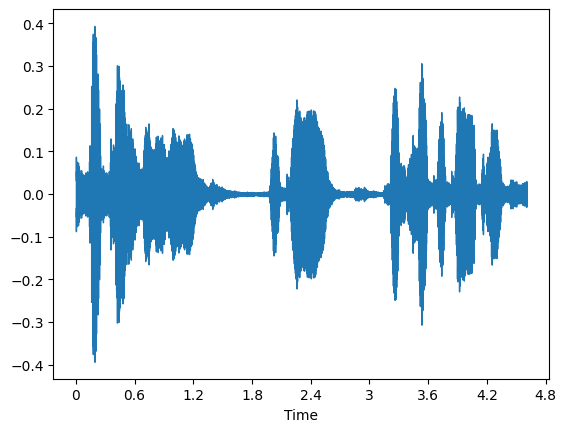

In [8]:
temp_viz(y_real_trump)

In [9]:
# Fake Audio Test Example 1
y_fake_trump_to_linus, sr_fake_trump_to_linus = librosa.load("/content/Cut version/trump-to-linus-cut-version.wav")

temp_fake_trump_to_linus,beat_frames_fake_trump_to_linus = librosa.beat.beat_track(y=y_fake_trump_to_linus, sr=sr_fake_trump_to_linus)

beat_times_fake_trump_to_linus = librosa.frames_to_time(beat_frames_fake_trump_to_linus, sr=sr_fake_trump_to_linus)
beat_times_fake_trump_to_linus


array([0.18575964, 0.81269841, 1.41641723, 2.02013605, 2.60063492,
       3.20435374])

TypeError: ignored

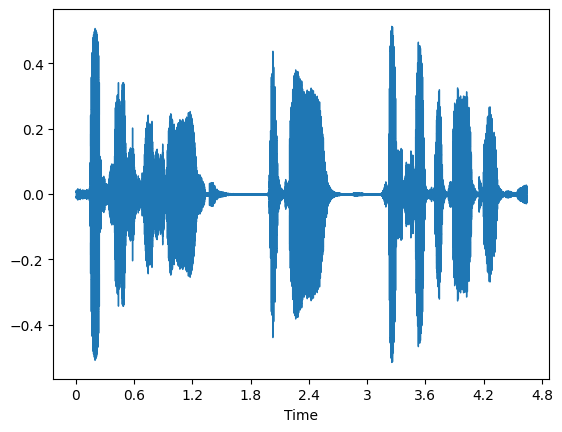

In [10]:
temp_viz(y_fake_trump_to_linus)

```
Example 2 with Linus Original and Linus to Trump
```

In [11]:
# Real Audio test Example 2
y_real_linus, sr_real_linus = librosa.load("/content/Cut version/linus-original-cut-version.wav")

temp_real_linus,beat_frames_real_linus = librosa.beat.beat_track(y=y_real_linus, sr=sr_real_linus)

beat_times_real_linus = librosa.frames_to_time(beat_frames_real_linus, sr=sr_real_linus)
beat_times_real_linus

array([0.13931973, 0.67337868, 1.16099773, 1.62539683, 2.08979592,
       2.53097506, 2.9721542 , 3.41333333, 3.83129252, 4.27247166,
       4.71365079, 5.15482993, 5.57278912])

TypeError: ignored

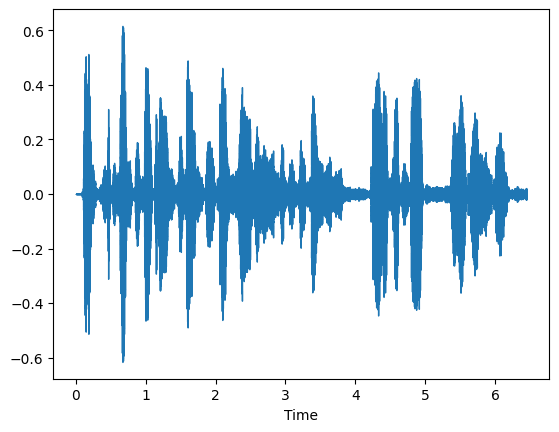

In [12]:
temp_viz(y_real_linus)

In [13]:
# Fake Audio Test Example 2
y_fake_linus_to_trump, sr_fake_linus_to_trump = librosa.load("/content/Cut version/linus-to-trump-cut-version.wav")

temp_fake_linus_to_trump,beat_frames_fake_linus_to_trump = librosa.beat.beat_track(y=y_fake_linus_to_trump, sr=sr_fake_linus_to_trump)

beat_times_fake_linus_to_trump = librosa.frames_to_time(beat_frames_fake_linus_to_trump, sr=sr_fake_linus_to_trump)
beat_times_fake_linus_to_trump

array([0.13931973, 0.67337868, 1.16099773, 1.62539683, 2.08979592,
       2.53097506, 2.9721542 , 3.41333333, 3.83129252, 4.27247166,
       4.71365079, 5.15482993, 5.59600907])

TypeError: ignored

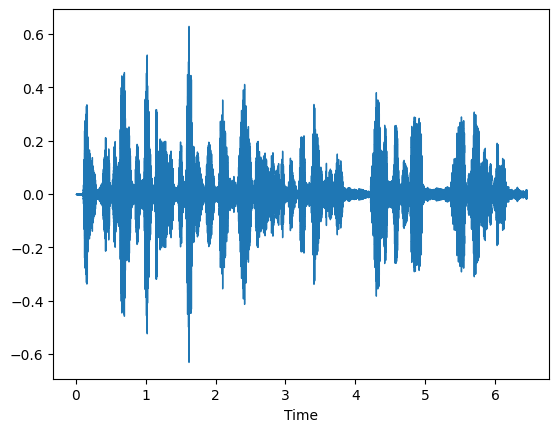

In [14]:
temp_viz(y_fake_linus_to_trump)

# Spectrogram Visualization
1. A spectrogram is a visual representation of a spectrum of frequencies of sound or other signals as they vary over time
2. X-axis is ```Time``` and y-axis is ```Frequency```

```A function that produces the visuals of any audio```

In [15]:
def spectro_viz(audiofile, realorfake):
  for items in audiofile:
    audio_music_array, audio_sample_rate = librosa.load(items)
    X = librosa.stft(audio_music_array)
    Xdb = librosa.amplitude_to_db(abs(X))
    plt.figure(figsize=(14,5))
    if realorfake == 1:
      plt.title("Real Audio File: " + items[38:])

    else:
      plt.title("Fake Audio File: " + items[34:])
    librosa.display.specshow(Xdb, sr=audio_sample_rate, x_axis="time",y_axis="hz")
    plt.xlabel("Time (s)")
    plt.ylabel("Frequency (hz)")
    intensity = plt.colorbar()
    intensity.set_label("Intensity (dB)")

```A function that reads the folder into an empty list for real audio```

In [16]:

def read_audio_folder_real(folder_name):
  empty = []
  directory = os.fsencode(folder_name)
  for file in os.listdir(directory):
    filename = os.fsdecode(file)

    if filename.endswith(".wav"):

        empty.append("/content/Clean Bona-Fide-Audio sample/" + filename)
    else:
      continue
  return empty



In [17]:
real_audio = read_audio_folder_real("Clean Bona-Fide-Audio sample")

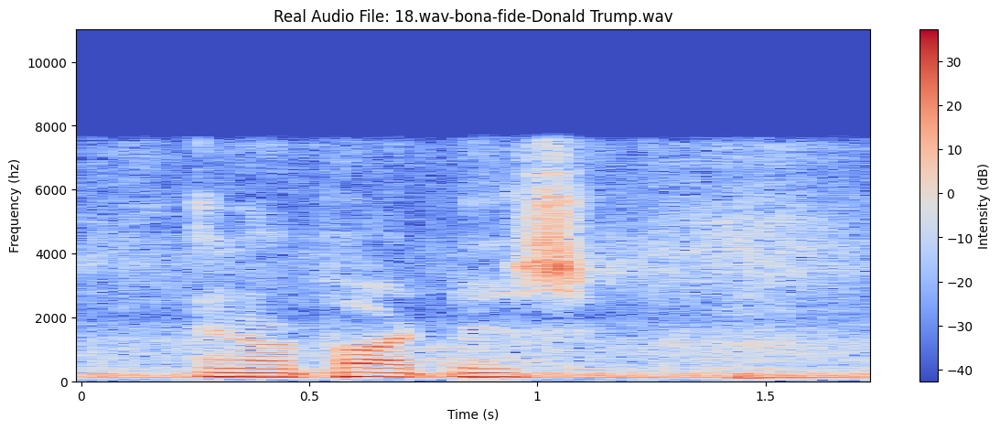

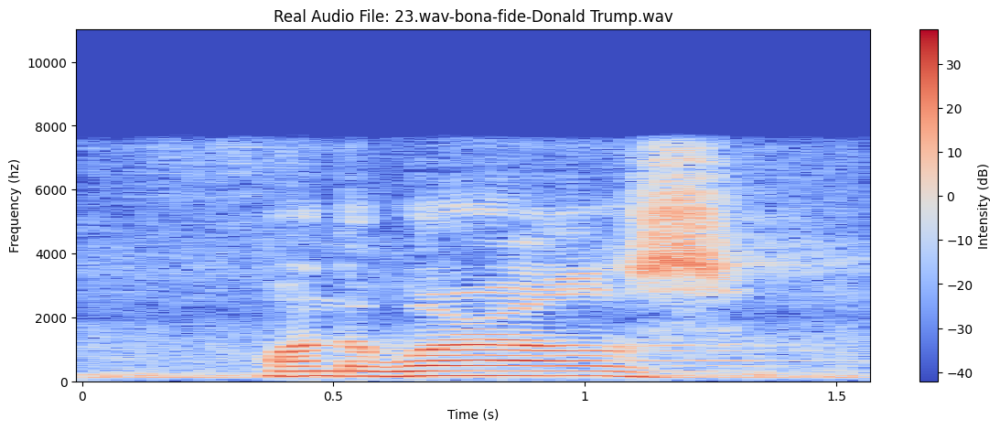

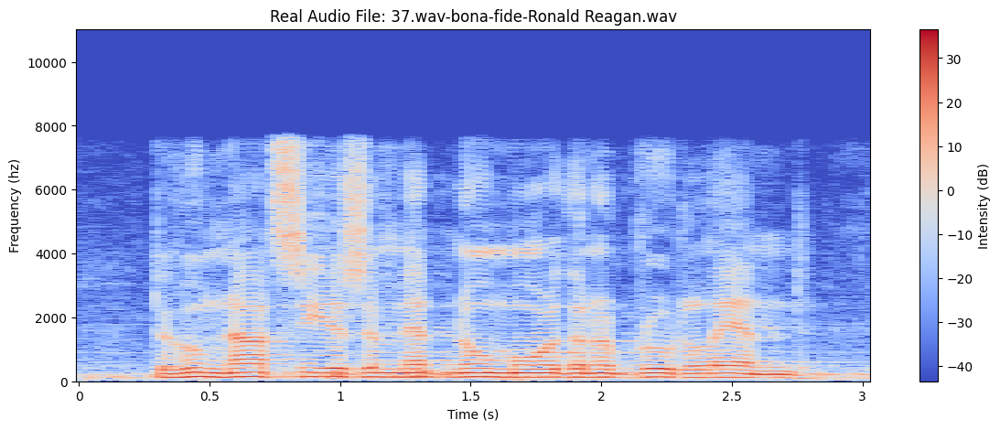

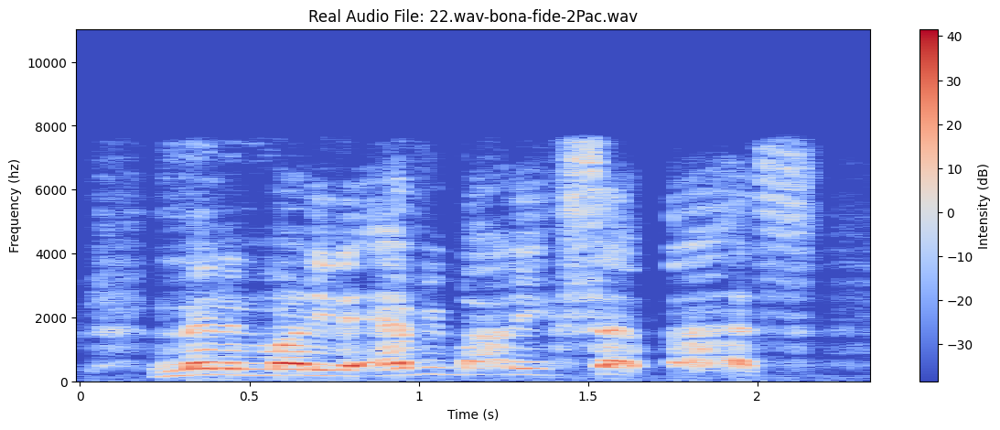

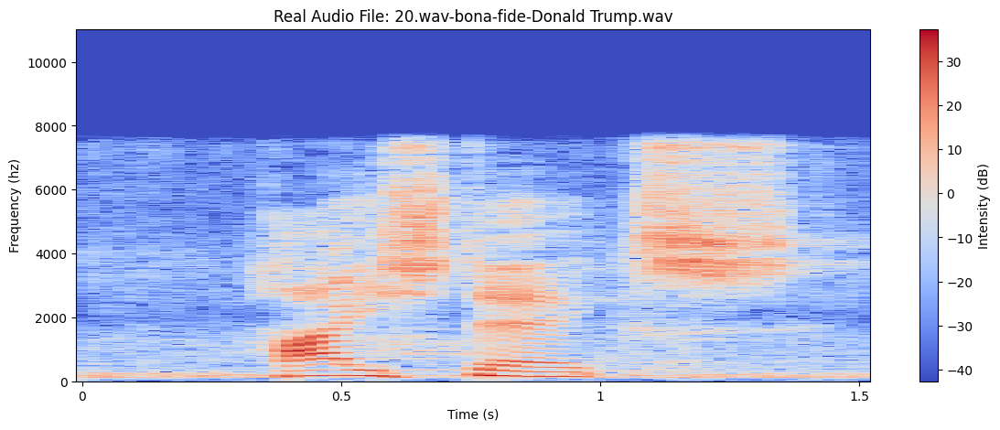

...

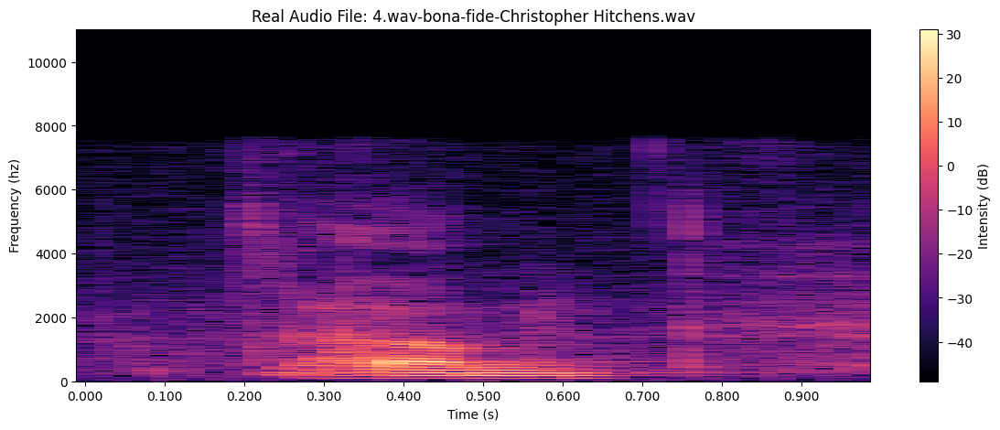

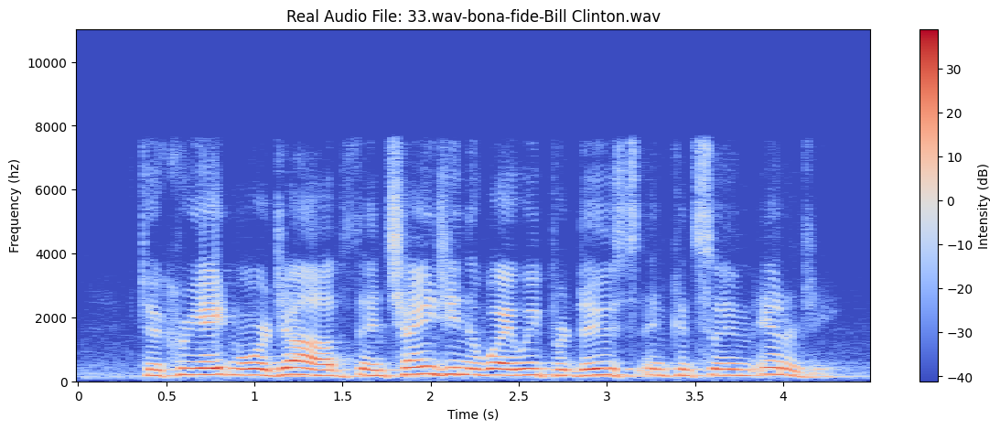

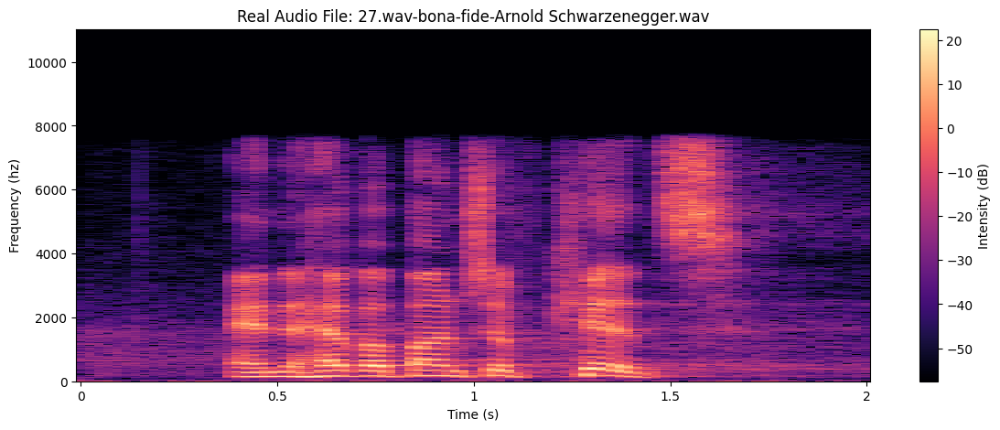

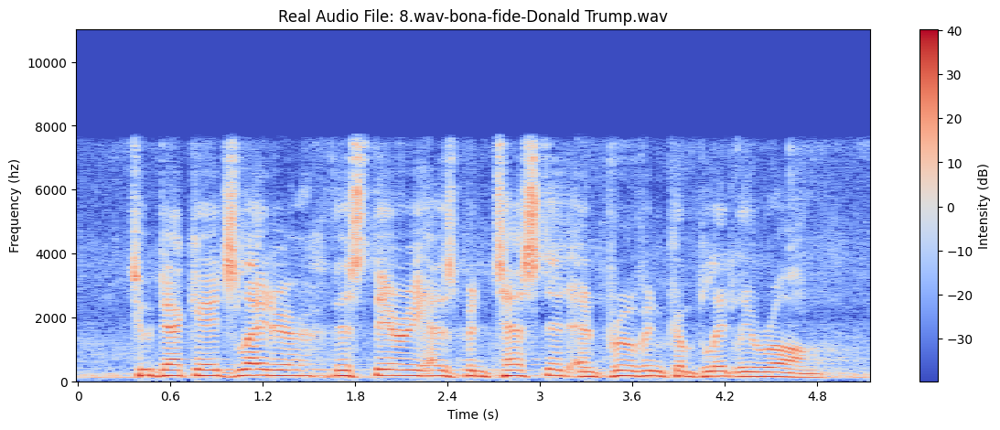

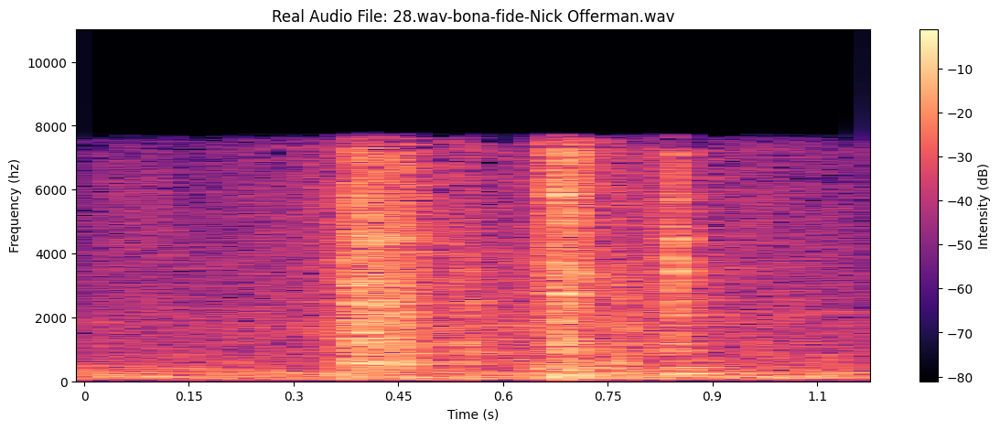

In [18]:
spectro_viz(real_audio, 1)

```A function that reads the folder into an empty list for fake audio```

In [19]:
def read_audio_folder_fake(folder_name):
  empty = []
  directory = os.fsencode(folder_name)
  for file in os.listdir(directory):
    filename = os.fsdecode(file)

    if filename.endswith(".wav"):

        empty.append("/content/Clean Spoof-Audio sample/" + filename)
    else:
      continue
  return empty

In [20]:
fake_audio = read_audio_folder_fake("Clean Spoof-Audio sample")

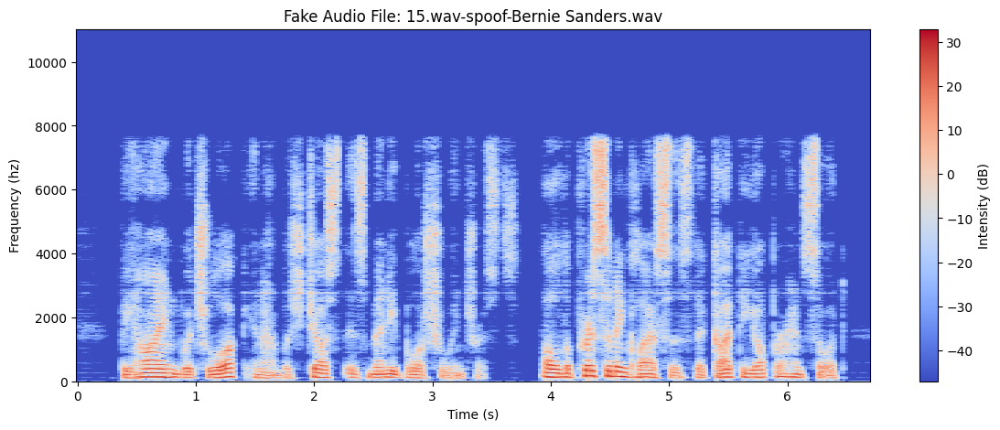

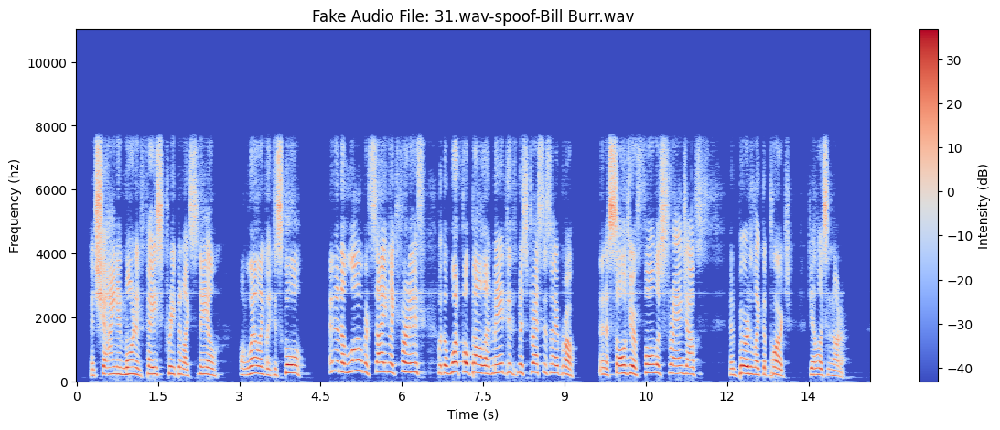

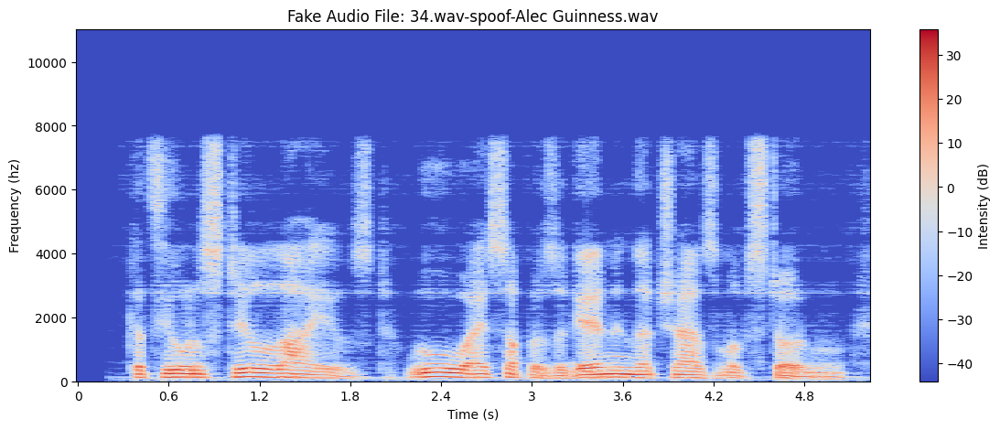

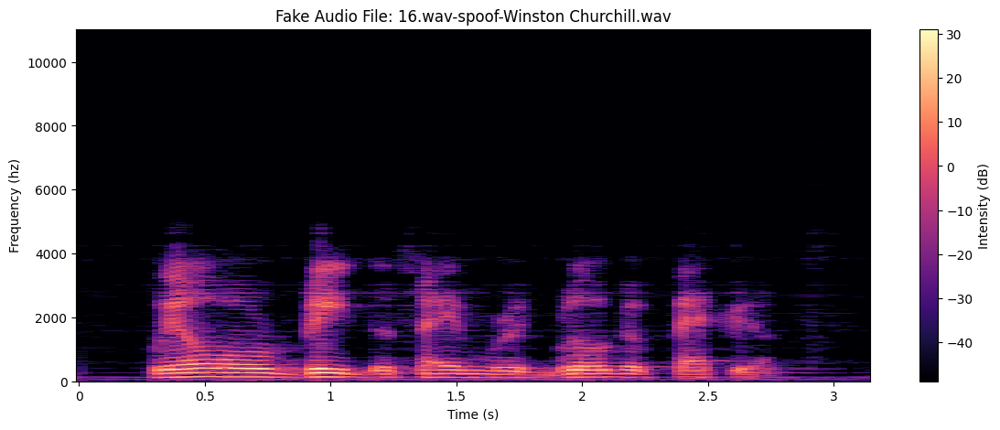

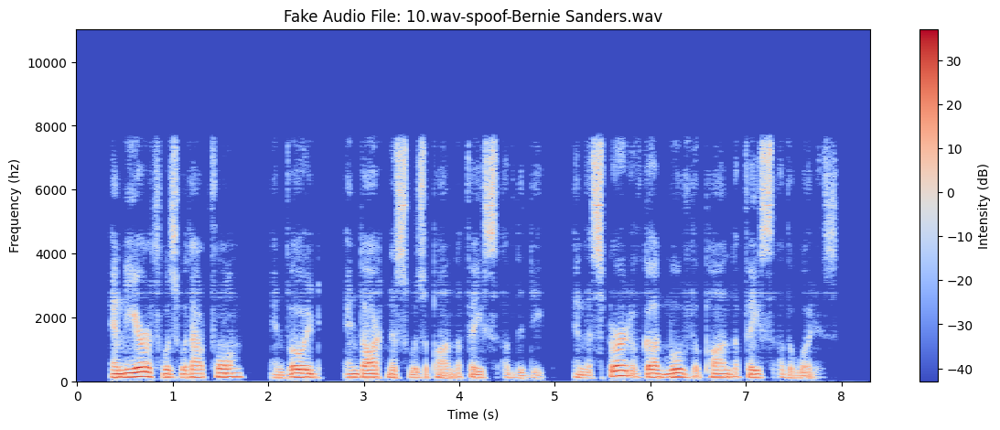

...

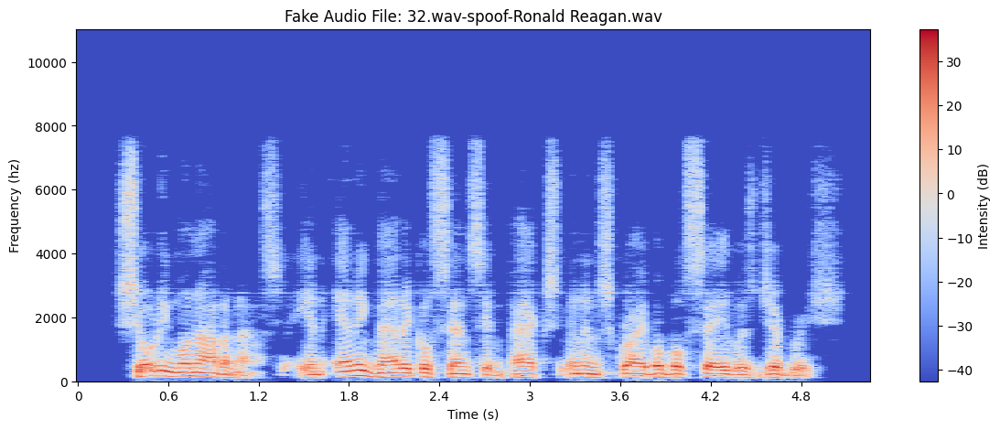

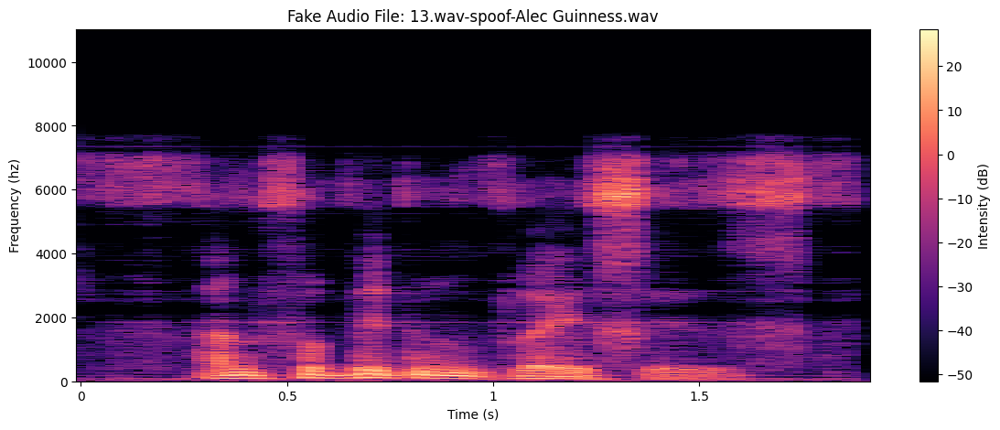

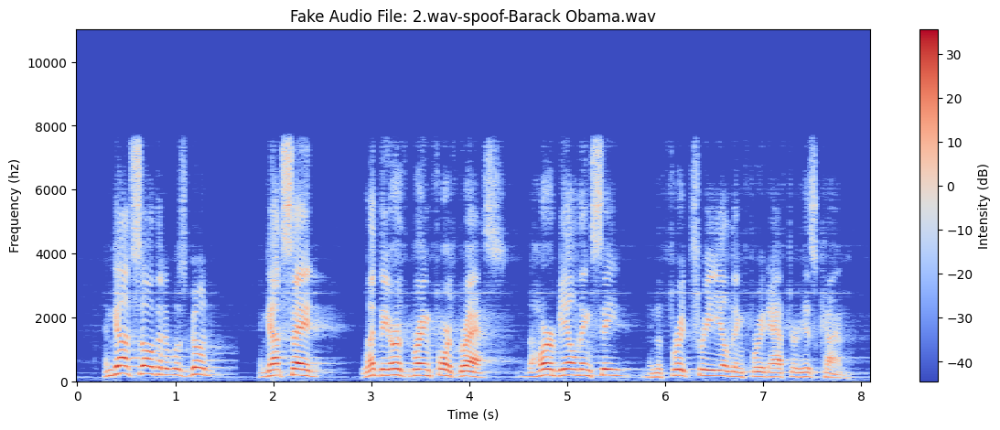

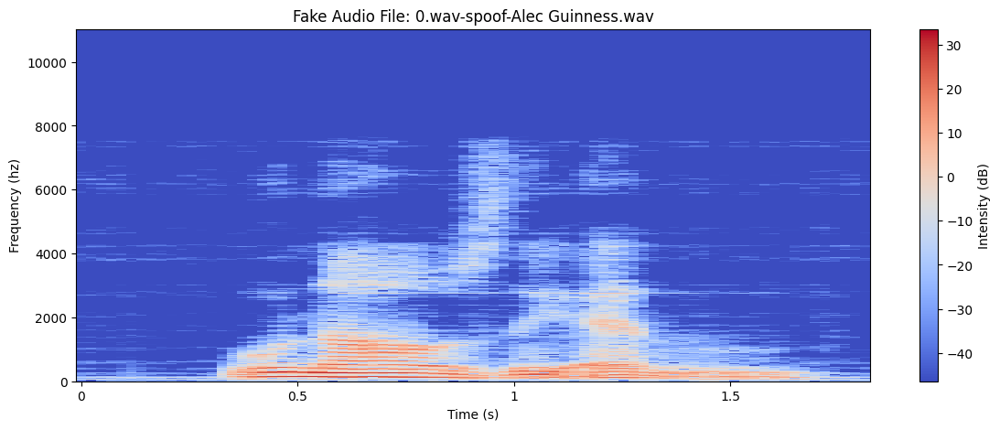

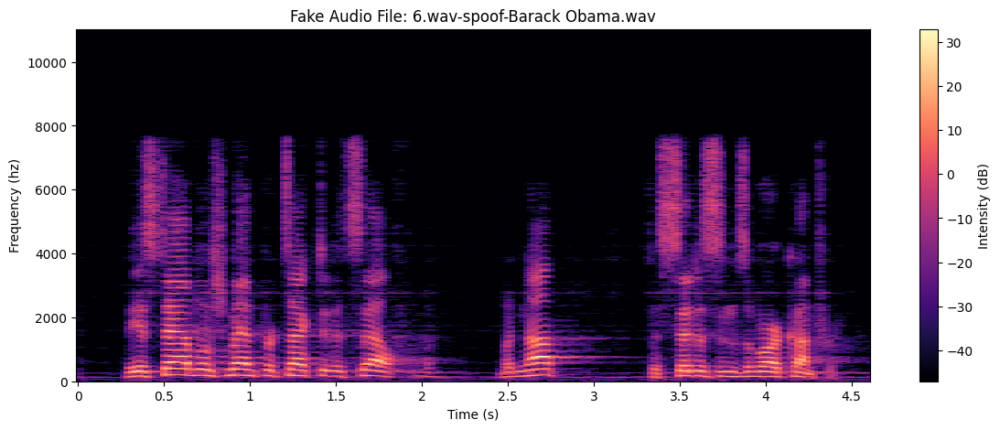

In [21]:
spectro_viz(fake_audio, 0)